<a href="https://colab.research.google.com/github/ocoropuj/Econ-424/blob/main/Econ_424_Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.graph_objs as go

import scipy.stats as stats
from scipy.optimize import curve_fit
from scipy.optimize import minimize
from scipy.stats import skew, kurtosis

import yfinance as yf

In [ ]:
sigmas = np.sqrt(2)

Define Probability Density Functions
$$
pdf_+:[\mu + 2\sigma,\infty) \rightarrow \mathbb{R_+}, \text{st. } pdf_+(x) = \frac{L}{(|x|+1)^{\alpha_+}}
$$
$$
pdf_-:(\infty, \mu - 2\sigma] \rightarrow \mathbb{R_+}, \text{st. } pdf_-(x) = \frac{L}{(|x|+1)^{\alpha_-}}
$$
$$
pdf_{mid} : (\mu - 2\sigma, \mu + 2\sigma) \rightarrow \mathbb{R_+}, \text{st. } pdf_{mid}(x) = \frac{1}{MAD \sqrt{2π}} e^{-\frac{(x-\mu)^2}{2MAD^2}}
$$


Define Utility function:
$$
U:\mathbb{R}_{\mathscr{R}}^n \times \mathbb{R}_{\mathcal{R}}^n \rightarrow \mathbb{R}
$$
$$
U(\mathscr{R}, \mathcal{R}, k) = \hat{\mathscr{R}} - \kappa\hat{\mathcal{R}}_R
$$

For returns $\hat{\mathscr{R}} = \langle w, \mu / \alpha_- \rangle$ and Risk $\hat{\mathcal{R}}_R = \langle w,\mathcal{R}_R w \rangle $

Define the risk term $\mathcal{R}_R$ as:
$$
\mathcal{R}_R = \sum_{i=1}^n \sum_{j=1}^n (\mathbb{E}_R[\delta(r_i)\delta(r_j)]T_i\otimes T_j)
$$
And we define the rolling expected value $\mathbb{E}_R$ as:
$$
\mathbb{E}_R [\delta(r_i),\delta(r_j)] = \frac{1}{n} \sum_{k=1}^n [\sum_{\nu \in[-R,R]_{\mathbb{Z}}} \sum_{\mu\in[-R,R]_{\mathbb{Z}}} \delta(r_{i,k+\mu})\delta(r_{j,k+\nu})]
$$
Finally we can use a deviation function $\delta(·)$ of:
$$
\delta(r) = \{{1/pdf_+(r) \text{ if }r>\mu+l\sigma \ , -1/pdf_-(r) \text{ if } r <\mu-l\sigma \, \ 0 \text{ o/w}}
$$

In [ ]:
# @title Download Data
eur_usd = yf.download(tickers='EURUSD=X', period='15y', interval='1d')
usd_jpy = yf.download(tickers='USDJPY=X', period='15y', interval='1d')
usd_cad = yf.download(tickers='USDCAD=X', period='15y', interval='1d')
usd_aud = yf.download(tickers='USDAUD=X', period='15y', interval='1d')
gbp_usd = yf.download(tickers='GBPUSD=X', period='15y', interval='1d')

# Create a single DataFrame containing only the required currency pairs
all_currencies = pd.DataFrame({
    'EURUSD': eur_usd['Close'],
    'USDJPY': usd_jpy['Close'],
    'USDAUD': usd_aud['Close'],
    'USDCAD': usd_cad['Close'],
    'GBPUSD': gbp_usd['Close']
})

all_currencies_r = np.log(all_currencies).diff().dropna()


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [ ]:
# @title Covariance Functions
def power_cov(ts1, ts2, n=2):
    return np.mean(np.sign((ts1 - ts1.mean())) * np.sign((ts2 - ts2.mean())) * abs(ts1 - ts1.mean())**(n/2) * abs(ts2 - ts2.mean())**(n/2))

def cov_d(df, d):
    """
    Compute a generalized covariance matrix for a given DataFrame and power 'd'.
    """
    Sigma_d = pd.DataFrame(index=df.columns, columns=df.columns)
    for i in df.columns:
        for j in df.columns:
            if pd.isnull(Sigma_d.at[i, j]):  # Calculate only if not already computed.
                result = power_cov(df[i], df[j], n=d)
                Sigma_d.at[i, j] = 0 if np.isnan(result) else result
                Sigma_d.at[j, i] = Sigma_d.at[i, j]  # Ensure symmetry
    return Sigma_d

In [ ]:
# @title Define Probability Distribution Functions
def power_law(x, L, alpha):
    return L / (np.abs(x) + 1)**alpha

def estimate_power_law(data):
    """
    Estimate the power law parameters L and alpha for the given data set, using
    the modified power law function that is adjusted for values near zero.

    :param data: The data for which to estimate the power law, should be already
                 centered and filtered for the specific tail.
    :return: A tuple (L, alpha) containing the estimated parameters.
    """

    # Check for sufficient data
    if len(data) == 0 or len(np.unique(data)) < 2:
        return np.nan, np.nan

    # Prepare data, no need to reflect negative data since function handles it
    data_filtered = data.copy()

    # Compute histogram
    hist_density, bin_edges = np.histogram(data_filtered, bins=30, density=True)
    x_values = 0.5 * (bin_edges[1:] + bin_edges[:-1])

    # Fit the power-law model
    try:
        params, _ = curve_fit(power_law, x_values, hist_density, p0=[np.max(hist_density), 1], bounds=(0, [np.inf, np.inf]))
    except RuntimeError:
        return np.nan, np.nan  # Fitting failed

    L_est, alpha_est = params
    return L_est, alpha_est

def pdf_details(data, resolution=1000, sigmas=sigmas):
    mean = data.mean()
    max_ = data.max()
    min_ = data.min()
    #MAD = np.mean(abs(data - mean))
    stdev = np.std(data)

    cut_data_positive = data[(data) > sigmas * stdev + mean]
    cut_data_negative = data[(data) < mean - sigmas * stdev]

    L_positive, alpha_positive = estimate_power_law(cut_data_positive.values)
    L_negatrive, alpha_negative = estimate_power_law(np.abs(cut_data_negative))

    x_p = np.linspace(stdev * sigmas + mean, max_, resolution)
    x_n = np.linspace(min_, - stdev * sigmas + mean, resolution)
    pdf_p = power_law(x_p, L_positive, alpha_positive)
    pdf_n = power_law(x_n, L_negatrive, alpha_negative)

    return pdf_p, pdf_n, x_p, x_n, alpha_positive, alpha_negative, L_positive, L_negatrive


In [ ]:
# @title Deviation Functions
def delta(r, x_n, x_p, pdf_n, pdf_p):
    # Determine the deviation based on position relative to distribution.
    if x_n.max() < r < x_p.min():
        return 0
    elif r >= x_p.min():
        index = np.abs(x_p - r).argmin()
        return np.log(1 / pdf_p[index])
    else:
        index = np.abs(x_n - r).argmin()
        return -np.log(1 / pdf_n[index])

def delta_vec(X, x_n, x_p, pdf_n, pdf_p):
    # Vectorized delta function application.
    return np.array([delta(r, x_n, x_p, pdf_n, pdf_p) for r in X])


In [ ]:
# @title Deviation Regular Functions
def delta_reg(r, x_min, x_max):
    # Determine the deviation based on position relative to distribution.
    if x_max < r < x_min:
        return 0
    elif r >= x_min:
        return r
    else:
        return r

def delta_reg_vec(X, x_min, x_max):
    # Vectorized delta function application.
    return np.array([delta_reg(r, x_min, x_max) for r in X])


In [ ]:
# @title Risks & Covariance Functions
def Exp_R(r_1, r_2, R, x_n_1, x_p_1, pdf_n_1, pdf_p_1, x_n_2, x_p_2, pdf_n_2, pdf_p_2):
    N = len(r_1)
    if len(r_1) != len(r_2):
        return 0

    # Initialize an accumulator for the expected rolling values
    vec_0 = np.zeros((N))
    # Loop over all valid positions accounting for the rolling window
    for n in range(R, N-R-1):
        SUM = 0 # Initialize sum for this position
        # Nested loops to iterate over the window defined by R
        for mu in range(-R,R):
            for nu in range(-R,R):
                try:
                    ret_1 = r_1[n+mu] # Handle Errors
                except:
                    ret_1 = 0
                try:
                    ret_2 = r_2[n+nu] # Handle Errors
                except:
                    ret_2 = 0

                # Update the sum with the product of deviations at positions mu and nu
                SUM += float(float(delta(ret_1, x_n_1, x_p_1, pdf_n_1, pdf_p_1)) * float(delta(ret_2, x_n_2, x_p_2, pdf_n_2, pdf_p_2)))
        # Store the computed sum in the accumulator
        vec_0[n] = SUM
        Exp_R = vec_0.sum()

        # Return the sum of the accumulated values as the expected risk
        return Exp_R

# Function to compute the pairwise expected rolling values across all pairs of columns in a dataframe
def Delta_R(df, R):
    # Initialize an empty dataframe to store the delta risk values
    Delta_R = pd.DataFrame(index=df.columns, columns=df.columns)

    # Iterate over all pairs of columns to compute their expected rolling values
    for i in df.columns:
        # Obtain the positive and negative tail details for column i
        pdf_p_i, pdf_n_i, x_p_i, x_n_i, _, __, ___, ____ = pdf_details(data=df[i])
        for j in df.columns:
            # Obtain the positive and negative tail details for column j
            pdf_p_j, pdf_n_j, x_p_j, x_n_j, _, __, ___, ____ = pdf_details(data=df[j])

            # Compute and store the expected rolling value for the pair (i, j)
            Delta_R.at[i, j] = Exp_R(df[i], df[j], R, x_n_1=x_n_i, x_p_1=x_p_i, pdf_n_1=pdf_n_i, pdf_p_1=pdf_p_i, x_n_2=x_n_j, x_p_2=x_p_j, pdf_n_2=pdf_n_j, pdf_p_2=pdf_p_j)

    return Delta_R

def Risk_Matrix_R(df, R, epsilon=0.01):
    # Initialize a risk matrix filled with zeros
    Risk_R = pd.DataFrame(index=df.columns, columns=df.columns).replace(np.nan, 0)

    # Iterate over all pairs of columns to adjust their risk values
    for i in df.columns:
        # Compute alpha factor adjustments for column i
        pdf_p_i, pdf_n_i, x_p_i, x_n_i, _, alpha_negative_i, ___, ____ = pdf_details(data=df[i])
        alpha_negative_i = max(1 + epsilon, alpha_negative_i)

        for j in df.columns:
            # Avoid redundant computation for symmetric entries
            if float(Risk_R.at[i, j]) == 0:
                # Compute alpha factor adjustments for column j
                pdf_p_j, pdf_n_j, x_p_j, x_n_j, _, alpha_negative_j, ___, ____ = pdf_details(data=df[j])
                alpha_negative_j = max(1 + epsilon, alpha_negative_j)

                # Calculate the adjusted risk value for the pair (i, j)
                Expected_R = Exp_R(df[i], df[j], R, x_n_i, x_p_i, pdf_n_i, pdf_p_i, x_n_j, x_p_j, pdf_n_j, pdf_p_j)

                # Apply the alpha factor adjustments and update the risk matrix symmetrically
                Risk_R.at[i, j] = Expected_R / (np.log(alpha_negative_i) * np.log(alpha_negative_j))
                Risk_R.at[j, i] = Risk_R.at[i, j]

    return Risk_R

In [ ]:
# @title Regular Risks & Covariance Functions
def Exp_Reg(r_1, r_2, R, x1_min, x1_max, x2_min, x2_max):
    N = len(r_1)
    if len(r_1) != len(r_2):
        return 0

    # Initialize an accumulator for the expected rolling values
    vec_0 = np.zeros((N))
    # Loop over all valid positions accounting for the rolling window
    for n in range(R, N-R-1):
        SUM = 0 # Initialize sum for this position
        # Nested loops to iterate over the window defined by R
        for mu in range(-R,R):
            for nu in range(-R,R):
                try:
                    ret_1 = r_1[n+mu] # Handle Errors
                except:
                    ret_1 = 0
                try:
                    ret_2 = r_2[n+nu] # Handle Errors
                except:
                    ret_2 = 0

                # Update the sum with the product of deviations at positions mu and nu
                SUM += float(float(delta_reg(ret_1, x1_min, x1_max)) * float(delta_reg(ret_2, x2_min, x2_max)))

        # Store the computed sum in the accumulator
        vec_0[n] = SUM
        Exp_R = vec_0.sum()

        # Return the sum of the accumulated values as the expected risk
        return Exp_R

# Function to compute the pairwise expected rolling values across all pairs of columns in a dataframe
def Delta_Reg(df, R, sigmas=sigmas):
    # Initialize an empty dataframe to store the delta risk values
    Delta_R = pd.DataFrame(index=df.columns, columns=df.columns)

    # Iterate over all pairs of columns to compute their expected rolling values
    for i in df.columns:
        # Obtain the positive and negative tail details for column i
        #pdf_p_i, pdf_n_i, x_p_i, x_n_i, _, __, ___, ____ = pdf_details(data=df[i])
        df_i = df[i]
        meani = df_i.mean()
        stdi = df_i.std()
        xi_min = meani + sigmas * stdi
        xi_max = meani - sigmas * stdi
        for j in df.columns:
            # Obtain the positive and negative tail details for column j
            df_j = df[j]
            meanj = df_j.mean()
            stdj = df_j.std()
            xj_min = meanj + sigmas * stdj
            xj_max = meanj - sigmas * stdj

            # Compute and store the expected rolling value for the pair (i, j)
            Delta_R.at[i, j] = Exp_Reg(r_1=df[i], r_2=df[j], R=R, x1_min=xi_min, x1_max=xi_max, x2_min=xj_min, x2_max=xj_max)

    return Delta_R


In [ ]:
# @title Returns
def returns_var(df):
    # Initialize a return variable array with zeros, one for each column
    ret = np.zeros((all_currencies_r.shape[1]))

    # Iterate over each column in the dataframe
    for i, Symbol in enumerate(df.columns):
        # Calculate the mean (mu) of the current column (symbol)
        mu = df[Symbol].mean()

        # Obtain the power law tail exponent for the positive tail (alpha_positive)
        # and for the negative tail (alpha_negative) without using the latter
        _, _, _, _, alpha_positive, alpha_negative, _, _ = pdf_details(df[Symbol])

        # Compute the return variable for the symbol as the mean divided by alpha_positive
        ret[i] = mu #/ np.log(alpha_positive)

        #Turn it into dataframes
        rets = pd.DataFrame([])
        rets['Returns'] = ret
        rets.index = df.columns

    # Return the returns variables across all symbols
    return rets

In [ ]:
# @title Utility function

def utility_function(weights, rets, risk_matrix, kappa):
    portfolio_return = np.dot(weights, rets['Returns'])
    portfolio_risk = np.dot(weights.T, np.dot(risk_matrix, weights))
    utility = portfolio_return - kappa * portfolio_risk
    return utility

In [ ]:
# Download financial data
df = yf.download(tickers='EURUSD=X', period='15y', interval='1d')
df_r = np.log(df['Close']).diff().dropna()

# Compute MAD
MAD = np.mean(np.abs(df_r - df_r.mean()))
std = df_r.std()

# Get PDF details
pdf_p, pdf_n, x_p, x_n, alpha_positive, alpha_negative, L_positive, L_negative = pdf_details(df_r, sigmas=1.5)
x = np.arange(x_n.min(), x_p.max(), np.mean([np.diff(x_n)[0], np.diff(x_p)[0]]))

[*********************100%%**********************]  1 of 1 completed


In [ ]:
# @title Random Variable
def rv_p(n=1, x_p=x_p, pdf_p=pdf_p):
    if n == 1:
        return np.random.choice(x_p, p=pdf_p/pdf_p.sum())
    else:
        return np.random.choice(x_p, size=n, p=pdf_p/pdf_p.sum()).squeeze()

def rv_n(n=1, x_n=x_n, pdf_n=pdf_n):
    if n == 1:
        return np.random.choice(x_n, p=pdf_n/pdf_n.sum())
    else:
        return np.random.choice(x_n, size=n, p=pdf_n/pdf_n.sum()).squeeze()

def rv_N(std, n=1, x=x):
    pdf = np.exp(-0.5 * (x/std)**2)
    if n == 1:
        return np.random.choice(x, p=pdf/pdf_n.sum())
    else:
        return np.random.choice(x, size=n, p=pdf/pdf.sum()).squeeze()


In [ ]:
tries = 100000
hist_actual, bin_edges_actual = np.histogram(df_r.values, density=True, bins=100)

In [ ]:
# @title Calculate weights of PDF
# Define ranges for random weights
weight_ranges = {
    'weight_p': (0, 0.1),
    'weight_n': (0, 0.1),
    'weight_MAD': (0.4, 1)
}

# Define a function to simulate histogram
def simulate_histogram(weights, tries, hist_actual, bin_edges_actual):
    weight_p, weight_n, weight_MAD = weights
    rv_positive = rv_p(n=np.round(tries*weight_p).astype(int), x_p=x_p, pdf_p=pdf_p)
    rv_negative = rv_n(n=np.round(tries*weight_n).astype(int), x_n=x_n, pdf_n=pdf_n)
    rv_MAD = rv_N(MAD, n=np.round(tries*weight_MAD).astype(int), x=x)
    randomvariables = np.concatenate([rv_positive, rv_negative, rv_MAD])
    hist_sim, _ = np.histogram(randomvariables, density=True, bins=bin_edges_actual)
    return hist_sim

# Define a function to calculate the deviation, skewness, and kurtosis
def deviation_function(weights, tries, hist_actual, bin_edges_actual):
    hist_sim = simulate_histogram(weights, tries, hist_actual, bin_edges_actual)
    deviation = ((hist_sim - hist_actual) ** 2).mean()   # Mean squared deviation
    skewness_diff = (skew(hist_sim) - skew(hist_actual))**2  # Difference in skewness
    kurtosis_diff = 10*(kurtosis(hist_sim) - kurtosis(hist_actual))**4  # Difference in kurtosis
    return deviation + skewness_diff + kurtosis_diff

# Generate random weights
def generate_random_weights():
    return {name: np.random.uniform(low, high) for name, (low, high) in weight_ranges.items()}

# Normalize weights
def normalize_weights(weights):
    total_weight = sum(weights.values())
    return {name: value / total_weight for name, value in weights.items()}

# Perform Monte Carlo simulation
def monte_carlo_simulation(num_iterations, hist_actual, bin_edges_actual):
    weights = [normalize_weights(generate_random_weights()) for _ in range(num_iterations)]
    deviations = [(deviation_function(weight.values(), tries, hist_actual, bin_edges_actual), weight) for weight in weights]
    min_deviation, optimal_weights = min(deviations, key=lambda x: x[0])
    return optimal_weights

# Get the weights corresponding to the minimum deviation
optimal_weights = monte_carlo_simulation(1000, hist_actual, bin_edges_actual)

weight_p, weight_n, weight_MAD = optimal_weights['weight_p'], optimal_weights['weight_n'], optimal_weights['weight_MAD']
print("Optimal Weights (Min Deviation):", optimal_weights)

Optimal Weights (Min Deviation): {'weight_p': 0.03664428221212341, 'weight_n': 0.0441223649269059, 'weight_MAD': 0.9192333528609707}


In [ ]:
tries = 1000000

rv_positive = rv_p(n=int(tries*weight_p), x_p=x_p, pdf_p=pdf_p)
rv_negative = rv_n(n=int(tries*weight_n), x_n=x_n, pdf_n=pdf_n)
rv_MAD = rv_N(MAD, n=int(tries*weight_MAD), x=x)
#rv_std = rv_N(std, n=int(tries*weight_std), x=x)

In [ ]:
randomvariables = np.append(rv_positive, np.append(rv_negative, rv_MAD))
hist_sim, bin_edges_sim = np.histogram(randomvariables, density=True, bins=100)

In [ ]:
np.abs(hist_sim - hist_actual).std()

2.671805966487499

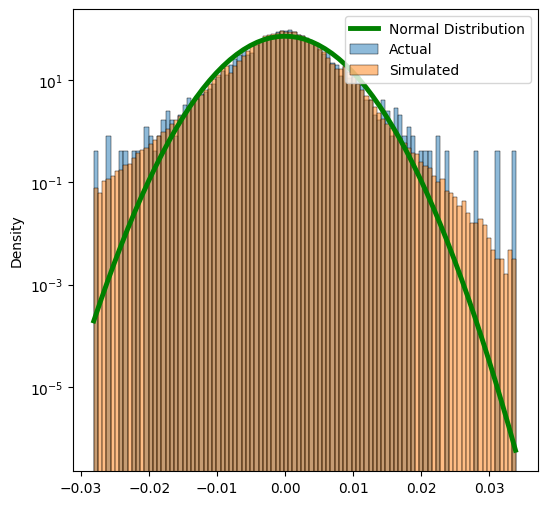

In [ ]:
plt.figure(figsize=(6,6))

sns.histplot(df_r.values, stat='density', bins=100, label='Actual', alpha=0.5)
sns.histplot(randomvariables, stat='density', bins=100, label='Simulated', alpha=0.5)
x = np.arange(df_r.min(), df_r.max(), 0.001)
Norm = np.exp(-0.5 * ((x-df_r.mean())/df_r.std())**2) / (df_r.std() * np.sqrt(2*np.pi))
plt.plot(x, Norm, label='Normal Distribution', c='g', linewidth=3.5)

plt.yscale('log')
plt.legend()
plt.show()

In [ ]:
print(f'Skewness Real: {df_r.skew()}, Simulated: {stats.skew(randomvariables)}')
print(f'Kurtosuis Real: {df_r.kurtosis()}, Simulated: {stats.kurtosis(randomvariables)}')

Skewness Real: -0.016166270298998735, Simulated: -0.15965628624966394
Kurtosuis Real: 2.2247752201955584, Simulated: 1.3947406462770484


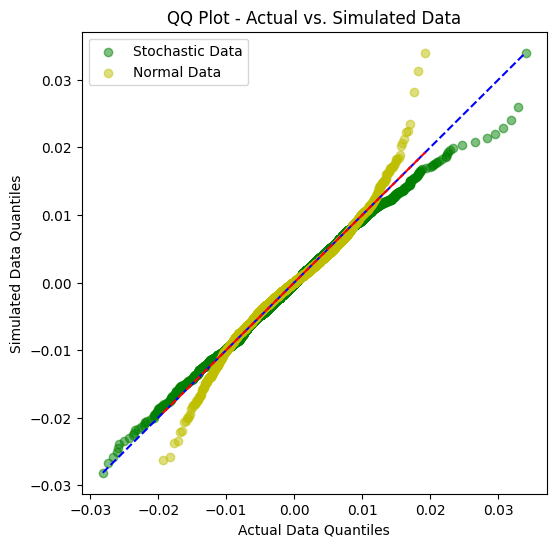

In [ ]:
# Calculate quantiles
actual_quantiles = np.percentile(df_r.values.flatten(), np.linspace(0, 100, 10000))
simulated_quantiles = np.percentile(randomvariables, np.linspace(0, 100, 10000))

# Create QQ plot
plt.figure(figsize=(6,6))
plt.scatter(actual_quantiles, simulated_quantiles, c='g', label='Stochastic Data', alpha=0.5)
plt.plot([min(actual_quantiles.min(), simulated_quantiles.min()), max(actual_quantiles.max(), simulated_quantiles.max())],
         [min(actual_quantiles.min(), simulated_quantiles.min()), max(actual_quantiles.max(), simulated_quantiles.max())], 'b--')


# Get actual data quantiles
actual_sorted = np.sort(df_r.values.flatten())
actual_quantiles = np.linspace(0, 1, len(actual_sorted), endpoint=False)
# Generate theoretical normal distribution quantiles

# Get theoretical normal distribution quantiles for the same probabilities
normal_quantiles = stats.norm.ppf(actual_quantiles, loc=np.mean(actual_sorted), scale=np.std(actual_sorted))

plt.scatter(normal_quantiles, actual_sorted, c='y', label='Normal Data', alpha=0.5)
plt.plot(normal_quantiles, normal_quantiles, 'r--')

plt.xlabel('Actual Data Quantiles')
plt.ylabel('Simulated Data Quantiles')
plt.title('QQ Plot - Actual vs. Simulated Data')
plt.legend()
plt.show()

In [ ]:
currencies = all_currencies_r.columns

In [ ]:
mu_vec = all_currencies_r.mean(axis=0)
Sigma = all_currencies_r.cov()
MAD = (all_currencies_r - mu_vec).abs().mean()
St_Dev = all_currencies_r.std()

alpha_values = pd.DataFrame(index=all_currencies_r.columns, columns=['alpha_positive', 'alpha_negative'])

# Iterate over each currency column in the returns DataFrame
for symbol in all_currencies_r.columns:
    # Extract the alpha values for the positive and negative tails
    _, _, _, _, alpha_positive, alpha_negative, _, _ = pdf_details(all_currencies_r[symbol])

    # Store the alpha values in the corresponding DataFrame cells
    alpha_values.at[symbol, 'alpha_positive'] = alpha_positive
    alpha_values.at[symbol, 'alpha_negative'] = alpha_negative



In [ ]:
power_cov(all_currencies_r[currencies[0]], all_currencies_r[currencies[0]], n=5)

9.138732887859717e-11

In [ ]:
St_Dev*100

EURUSD    0.555287
USDJPY    0.588955
USDAUD    0.697533
USDCAD    0.511034
GBPUSD    0.580191
dtype: float64

In [ ]:
(alpha_values.astype(float))

,alpha_positive,alpha_negative
EURUSD,273.839866,277.748388
USDJPY,297.325742,261.404596
USDAUD,281.013719,213.785496
USDCAD,256.957535,298.799093
GBPUSD,280.915328,300.604460


In [ ]:
def center_sigmoid(x, exponent=100):
    return 2 / (np.exp(-x*exponent) + 1) - 1

In [ ]:
rets = returns_var(all_currencies_r)
normal_const = 1 / np.abs(rets).mean()
normal_rets = rets * normal_const


In [ ]:
rets*100

,Returns
EURUSD,-0.003943
USDJPY,0.011110
USDAUD,-0.000290
USDCAD,0.001365
GBPUSD,-0.002745


In [ ]:
RMR = Delta_Reg(all_currencies_r, R=7)#cov_d(all_currencies_r, d=2)#Risk_Matrix_R(all_currencies_r, R=7)
normal_RMR = RMR / np.abs(RMR).mean().mean()


In [ ]:
cov_d(all_currencies_r, d=2)

,EURUSD,USDJPY,USDAUD,USDCAD,GBPUSD
EURUSD,0.000031,-0.000009,-0.000022,-0.000014,0.00002
USDJPY,-0.000009,0.000035,0.000006,0.000002,-0.000006
USDAUD,-0.000022,0.000006,0.000049,0.000025,-0.000023
USDCAD,-0.000014,0.000002,0.000025,0.000026,-0.000014
GBPUSD,0.00002,-0.000006,-0.000023,-0.000014,0.000034


In [ ]:
normal_RMR

,EURUSD,USDJPY,USDAUD,USDCAD,GBPUSD
EURUSD,0.946507,-0.262264,-1.837689,-1.311957,0.506012
USDJPY,-0.262264,0.07267,0.509199,0.363526,-0.140209
USDAUD,-1.837689,0.509199,3.567962,2.547228,-0.982447
USDCAD,-1.311957,0.363526,2.547228,1.818509,-0.701385
GBPUSD,0.506012,-0.140209,-0.982447,-0.701385,0.270519


In [ ]:
# @title Plot definitions
RETURNS = normal_rets
RISK_cov4 = cov_d(all_currencies_r, d=4) / np.abs(cov_d(all_currencies_r, d=4)).mean().mean()
RISK_RMR = normal_RMR##smoothed_RMR

RISK = normal_RMR

x_range = [0, 5]
y_range = [-5, 5]
Ranges = False
LOG = True

# Assuming 'RETURNS' and 'RISK' are predefined and correctly formatted
n = len(all_currencies_r.columns)  # Number of assets

# Generate random portfolios again with corrected weight constraints logic if needed
num_portfolios = 10000000
all_weights = np.random.uniform(-1, 1, (num_portfolios, n))
norm_weights = all_weights / np.sum(all_weights, axis=1, keepdims=True)
valid_weights = norm_weights[(norm_weights.max(axis=1) <= 2) & (norm_weights.min(axis=1) >= -1)]

# Recalculate portfolio returns and risks for valid weights
port_returns = np.dot(valid_weights, RETURNS['Returns'])
port_risks = np.abs(np.einsum('ij,ij->i', np.dot(valid_weights, RISK), valid_weights))

# Assuming 'port_risks' and 'port_returns' are available from previous context
min_risk, max_risk = min(port_risks), max(port_risks)
min_return, max_return = min(port_returns), max(port_returns)

# Update kappa values and define risk range based on portfolio risks
kappas = np.arange(10000, 100000000, 10000000)
risk_values = np.linspace(min_risk, max_risk, 10000)  # Dynamic risk range


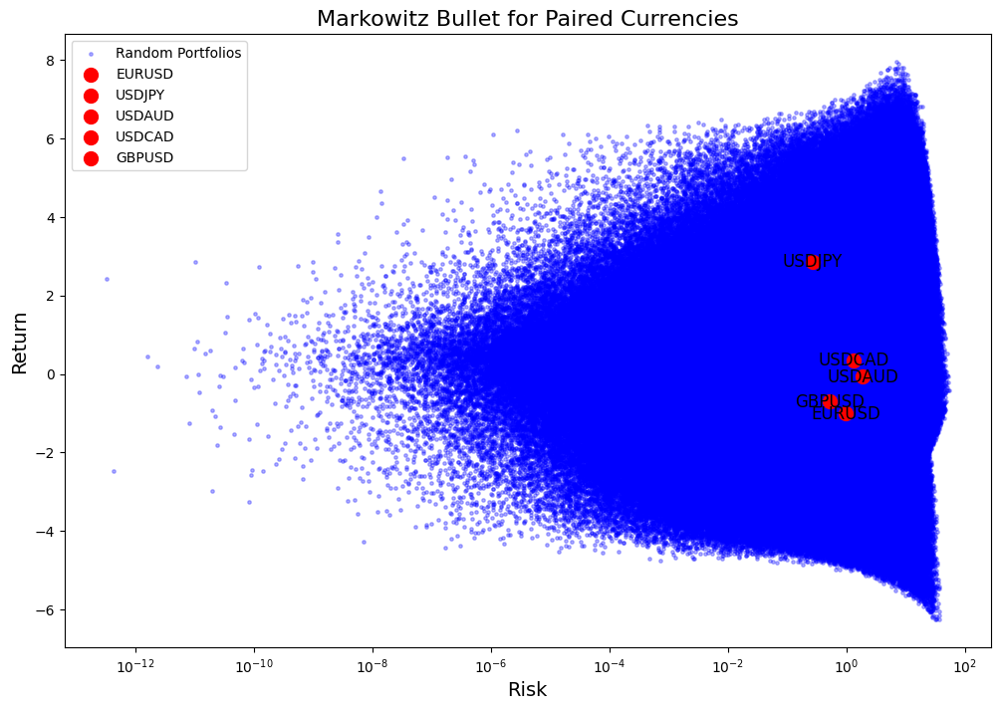

In [ ]:
# @title Plot Matplotlib
fig, ax = plt.subplots(figsize=(12, 8))

# Plotting indifference curves
#for kappa in kappas:
#    returns_for_curves = [max(min_return, min(max_return, kappa * risk ** 2 + (min_return / kappa))) for risk in risk_values]
#    ax.plot(risk_values, returns_for_curves)#, label=f'Indifference Curve (κ={kappa:.1f})')

# Adding scatter plot for random portfolios
ax.scatter(port_risks, port_returns, color='blue', s=6, alpha=0.3, label='Random Portfolios')

# Adding scatter plot for individual currencies
for i, symbol in enumerate(all_currencies_r.columns):
    indiv_return = RETURNS.loc[symbol, 'Returns']
    indiv_risk = np.sqrt(RISK.loc[symbol, symbol])
    ax.scatter(indiv_risk, indiv_return, color='red', s=100, label=f'{symbol}')
    ax.text(indiv_risk, indiv_return, symbol, ha='center', va='center', fontsize=12)

# Set log scale for x-axis if LOG is True
if LOG:
    ax.set_xscale('log')

# Updating plot titles and labels
ax.set_title('Markowitz Bullet for Paired Currencies', fontsize=16)
ax.set_xlabel('Risk', fontsize=14)
ax.set_ylabel('Return', fontsize=14)
ax.legend(loc='upper left')

# Applying specific ranges if Ranges is enabled
if Ranges:
    ax.set_xlim(x_range)
    ax.set_ylim(y_range)

plt.show()


In [ ]:
# Assuming 'RETURNS' and 'RISK' dataframes are already defined
expected_returns = RETURNS['Returns']  # Vector of expected returns
risk_matrix = RISK.values  # Risk matrix

# Define the objective function (negative Sharpe ratio for minimization)
def neg_sharpe_ratio(weights, expected_returns, risk_matrix, kappa=40):
    portfolio_return = np.dot(weights, expected_returns)
    portfolio_risk = np.dot(weights, np.dot(risk_matrix, weights))

    return -portfolio_return / portfolio_risk

# Constraints and bounds
n = len(expected_returns)  # Number of assets
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})  # Weights sum to 1
#constraints = ({'type': 'ineq', 'fun': lambda x: np.dot(np.dot(risk_matrix, x), x)})  # Portfolio risk greater than 0
bounds = [(-1, 2) for _ in range(n)]  # Individual weight bounds

# Initial guess (equal distribution considering constraints)
initial_weights = np.array([1 / n if 1 / n < 2 else 2 for _ in range(n)])

# Optimization
result = minimize(neg_sharpe_ratio, initial_weights, args=(expected_returns, risk_matrix),
                  method='SLSQP', bounds=bounds, constraints=constraints)

# Extract the optimal weights and create a DataFrame
optimal_weights = result.x
optimal_weights = optimal_weights / np.sum(optimal_weights)
weights_df = pd.DataFrame(data=optimal_weights, index=RETURNS.index, columns=['Weight'])


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_optimize.py:404: RuntimeWarning:

Values in x were outside bounds during a minimize step, clipping to bounds



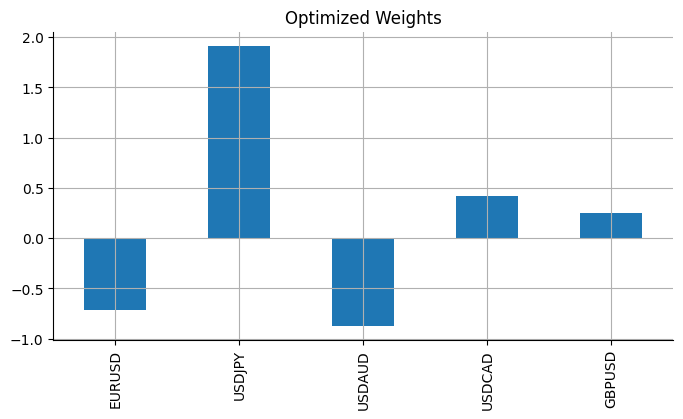

In [ ]:
weights_df['Weight'].plot(kind='bar', figsize=(8, 4), title='Optimized Weights')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.grid()
plt.show()

In [ ]:
print(f'Risk: {np.dot((np.dot(RISK.values, weights_df.values)).squeeze(), weights_df.values)[0]}')
print(f'Returns: {round(np.dot(weights_df.values.squeeze(), expected_returns) / normal_const * 100, 3)[0]}%')

Risk: 3.222260234028524e-10
Returns: 0.024%


In [ ]:
# @title Plot definitions
RETURNS = normal_rets
RISK_cov4 = cov_d(all_currencies_r, d=2) / np.abs(cov_d(all_currencies_r, d=2)).mean().mean()
RISK_RMR = normal_RMR##smoothed_RMR

RISK = RISK_cov4

x_range = [0, 5]
y_range = [-5, 5]
Ranges = False
LOG = False

# Assuming 'RETURNS' and 'RISK' are predefined and correctly formatted
n = len(all_currencies_r.columns)  # Number of assets

# Generate random portfolios again with corrected weight constraints logic if needed
num_portfolios = 100000
all_weights = np.random.uniform(-1, 1, (num_portfolios, n))
norm_weights = all_weights / np.sum(all_weights, axis=1, keepdims=True)
valid_weights = norm_weights[(norm_weights.max(axis=1) <= 2) & (norm_weights.min(axis=1) >= -1)]

# Recalculate portfolio returns and risks for valid weights
port_returns = np.dot(valid_weights, RETURNS['Returns'])
port_risks = np.abs(np.einsum('ij,ij->i', np.dot(valid_weights, RISK), valid_weights))

# Assuming 'port_risks' and 'port_returns' are available from previous context
min_risk, max_risk = min(port_risks), max(port_risks)
min_return, max_return = min(port_returns), max(port_returns)

# Update kappa values and define risk range based on portfolio risks
kappas = np.arange(1, 50, 5)
risk_values = np.linspace(min_risk, max_risk, 10000)  # Dynamic risk range


In [ ]:
# @title Plot Plotly
# Create a hover text series including the weight information for each portfolio
hover_texts = ['Weights: ' + ', '.join([f"{symbol}: {weight:.2f}" for symbol, weight in zip(all_currencies_r.columns, weights)]) for weights in valid_weights]

# Initialize the plotly graph object
fig = go.Figure()

# Plot indifference curves for each kappa
for kappa in kappas:
    # Calculate the returns for each risk level, ensuring they are within the range observed
    returns_for_curves = [max(min_return, min(max_return, kappa * risk ** 2 + (min_return / kappa))) for risk in risk_values]
    fig.add_trace(go.Scatter(x=risk_values, y=returns_for_curves, mode='lines', name=f'Indifference Curve (κ={kappa:.1f})'))

# Add scatter plot for random portfolios
fig.add_trace(go.Scatter(x=port_risks, y=port_returns, mode='markers', marker=dict(color='blue', size=6, opacity=0.3),name='Random Portfolios'))

# Add scatter plot for individual currencies
for i, symbol in enumerate(all_currencies_r.columns):
    indiv_return = RETURNS.loc[symbol, 'Returns']
    indiv_risk = np.sqrt(RISK.loc[symbol, symbol])

    fig.add_trace(go.Scatter(x=[indiv_risk], y=[indiv_return], mode='markers+text', marker=dict(color='red', size=10), name=symbol, text=[symbol],textposition="top center"))

# Add scatter plot for random portfolios
fig.add_trace(go.Scatter(x=port_risks, y=port_returns, mode='markers', marker=dict(color='blue', size=6, opacity=0.3), name='Random Portfolios', text=hover_texts, hoverinfo='text'))

# Add scatter plot for individual currencies
for i, symbol in enumerate(all_currencies_r.columns):
    indiv_return = RETURNS.loc[symbol, 'Returns']
    indiv_risk = np.sqrt(RISK.loc[symbol, symbol])

    fig.add_trace(go.Scatter(x=[indiv_risk], y=[indiv_return], mode='markers+text', marker=dict(color='red', size=10), name=symbol, text=[symbol], textposition="top center"))

# Update layout for clearer visualization
if Ranges is True:
    fig.update_layout(title='Interactive Markowitz Bullet for Paired Currencies with Indifference Curves', xaxis_title='Risk', yaxis_title='Return', legend_title='Legend', width=1200, height=800, xaxis=dict(range=x_range), yaxis=dict(range=y_range))
if Ranges is False:
    fig.update_layout(title='Interactive Markowitz Bullet for Paired Currencies with Indifference Curves', xaxis_title='Risk', yaxis_title='Return', legend_title='Legend', width=1200, height=800)

if LOG is True:
    fig.update_layout(xaxis=dict(type='log'))
if LOG is False:
    fig.update_layout(xaxis=dict(type='linear'), yaxis=dict(type='linear'))

fig.show()

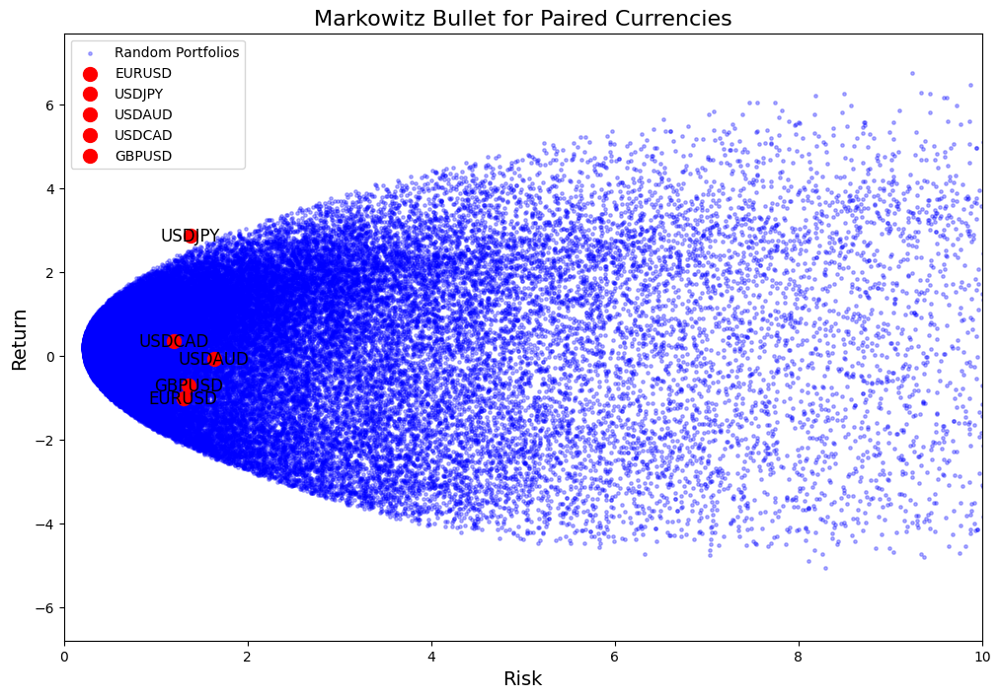

In [ ]:
# @title Plot Matplotlib
fig, ax = plt.subplots(figsize=(12, 8))

# Plotting indifference curves
#for kappa in kappas:
#    returns_for_curves = [max(min_return, min(max_return, kappa * risk ** 2 + (min_return / kappa))) for risk in risk_values]
#    ax.plot(risk_values, returns_for_curves)#, label=f'Indifference Curve (κ={kappa:.1f})')

# Adding scatter plot for random portfolios
ax.scatter(port_risks, port_returns, color='blue', s=6, alpha=0.3, label='Random Portfolios')

# Adding scatter plot for individual currencies
for i, symbol in enumerate(all_currencies_r.columns):
    indiv_return = RETURNS.loc[symbol, 'Returns']
    indiv_risk = np.sqrt(RISK.loc[symbol, symbol])
    ax.scatter(indiv_risk, indiv_return, color='red', s=100, label=f'{symbol}')
    ax.text(indiv_risk, indiv_return, symbol, ha='center', va='center', fontsize=12)

# Set log scale for x-axis if LOG is True
if LOG:
    ax.set_xscale('log')

# Updating plot titles and labels
ax.set_title('Markowitz Bullet for Paired Currencies', fontsize=16)
ax.set_xlabel('Risk', fontsize=14)
ax.set_ylabel('Return', fontsize=14)
ax.legend(loc='upper left')

# Applying specific ranges if Ranges is enabled
if Ranges:
    ax.set_xlim(x_range)
    ax.set_ylim(y_range)

plt.xlim(0,10)
plt.show()


In [ ]:
# Assuming 'RETURNS' and 'RISK' dataframes are already defined
expected_returns = RETURNS['Returns']  # Vector of expected returns
risk_matrix = RISK.values  # Risk matrix

# Define the objective function (negative Sharpe ratio for minimization)
def neg_sharpe_ratio(weights, expected_returns, risk_matrix, kappa=40):
    portfolio_return = np.dot(weights, expected_returns)
    portfolio_risk = np.dot(weights, np.dot(risk_matrix, weights))

    return -portfolio_return / portfolio_risk

# Constraints and bounds
n = len(expected_returns)  # Number of assets
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})  # Weights sum to 1
#constraints = ({'type': 'ineq', 'fun': lambda x: np.dot(np.dot(risk_matrix, x), x)})  # Portfolio risk greater than 0
bounds = [(-1, 2) for _ in range(n)]  # Individual weight bounds

# Initial guess (equal distribution considering constraints)
initial_weights = np.array([1 / n if 1 / n < 2 else 2 for _ in range(n)])

# Optimization
result = minimize(neg_sharpe_ratio, initial_weights, args=(expected_returns, risk_matrix),
                  method='SLSQP', bounds=bounds, constraints=constraints)

# Extract the optimal weights and create a DataFrame
optimal_weights = result.x
optimal_weights = optimal_weights / np.sum(optimal_weights)
weights_df = pd.DataFrame(data=optimal_weights, index=RETURNS.index, columns=['Weight'])


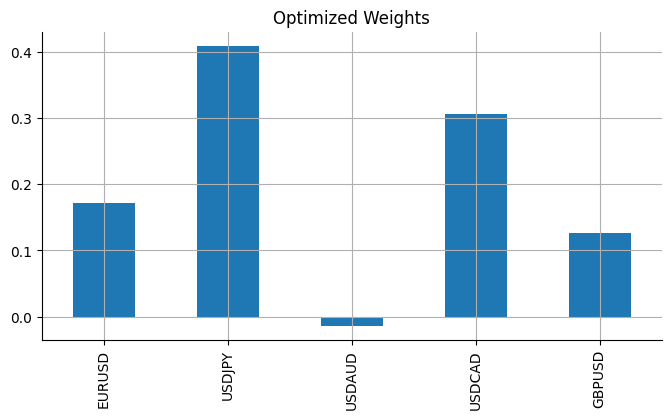

In [ ]:
weights_df['Weight'].plot(kind='bar', figsize=(8, 4), title='Optimized Weights')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.grid()
plt.show()

In [ ]:
print(f'Risk: {np.dot((np.dot(RISK.values, weights_df.values)).squeeze(), weights_df.values)[0]}')
print(f'Returns: {round(np.dot(weights_df.values.squeeze(), expected_returns) / normal_const * 100, 3)[0]}%')

Risk: 0.352699990574954
Returns: 0.004%


In [ ]:
def portfolio_variance(weights, risk_matrix):
    return np.dot(weights, np.dot(risk_matrix, weights))

# Objective function for minimum risk (portfolio variance)
def min_risk_objective(weights, risk_matrix):
    return portfolio_variance(weights, risk_matrix)

# Optimization to minimize portfolio variance
min_risk_result = minimize(min_risk_objective, initial_weights, args=(risk_matrix),
                           method='SLSQP', bounds=bounds, constraints=constraints)

# Extract the minimum risk weights and create a DataFrame
min_risk_weights = min_risk_result.x
min_risk_weights = min_risk_weights / np.sum(min_risk_weights)  # Ensure weights sum to 1
min_risk_weights_df = pd.DataFrame(data=min_risk_weights, index=RETURNS.index, columns=['Min Risk Weight'])

min_risk_weights_df

,Min Risk Weight
EURUSD,0.265241
USDJPY,0.175296
USDAUD,0.139286
USDCAD,0.236795
GBPUSD,0.183382


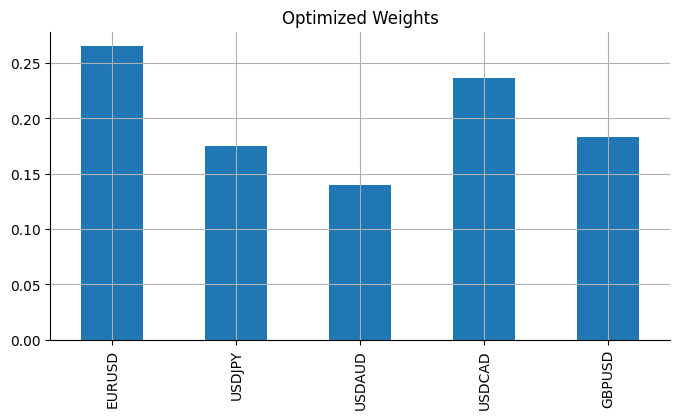

In [ ]:
min_risk_weights_df['Min Risk Weight'].plot(kind='bar', figsize=(8, 4), title='Optimized Weights')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.grid()
plt.show()

In [ ]:
def neg_sharpe_ratio(weights, expected_returns, risk_matrix, kappa=40):
    portfolio_return = np.dot(weights, expected_returns)
    portfolio_risk = np.dot(weights, np.dot(risk_matrix, weights))

    return -portfolio_return / portfolio_risk


class Time_Series_Set:
    def __init__(self, df, sigmas):
        self.df = df
        self.sigmas = sigmas
        self.mean = self.df.mean(axis=0)
        self.MAD = np.mean(abs(self.df - self.mean), axis=0)
        self.std = self.df.std(axis=0)
        self.Sigma = self.df.cov()
        self.Sigma_4 = self.cov_d(d=4)

    def cov_d(self, d):
        Sigma_d = pd.DataFrame(index=self.df.columns, columns=self.df.columns)
        for i in self.df.columns:
            for j in self.df.columns:
                if pd.isnull(Sigma_d.at[i, j]):
                    result = power_cov(self.df[i], self.df[j], d)
                    Sigma_d.at[i, j] = result if not np.isnan(result) else 0
                    Sigma_d.at[j, i] = Sigma_d.at[i, j]
        return Sigma_d

    def Delta_Reg(self):
        Delta_R = pd.DataFrame(index=self.df.columns, columns=self.df.columns)
        for i in self.df.columns:
            for j in self.df.columns:
                mean_i = self.df[i].mean(axis=0)
                std_i = self.df[i].std()
                xi_min = mean_i - self.sigmas * std_i
                xi_max = mean_i + self.sigmas * std_i

                mean_j = self.df[j].mean(axis=0)
                std_j = self.df[j].std()
                xj_min = mean_j - self.sigmas * std_j
                xj_max = mean_j + self.sigmas * std_j

                Delta_R.at[i, j] = self.Exp_Reg(self.df[i], self.df[j], xi_min, xi_max, xj_min, xj_max)
        return Delta_R

    def Exp_Reg(self, r_1, r_2, x1_min, x1_max, x2_min, x2_max):
        N = len(r_1)
        assert len(r_1) == len(r_2), "Lengths of rate series do not match."

        r_1_adj = self.delta_reg_vec(r_1, x1_min, x1_max)
        r_2_adj = self.delta_reg_vec(r_2, x2_min, x2_max)

        result = np.sum(r_1_adj * r_2_adj)
        return result

    @staticmethod
    def delta_reg(r, x_min, x_max):
        if x_max < r < x_min:
            return 0
        return r

    @staticmethod
    def delta_reg_vec(X, x_min, x_max):
        return np.array([Time_Series_Set.delta_reg(r, x_min, x_max) for r in X])

    def get_weights(self, R=2):
        self.Delta_R = self.Delta_Reg()
        risk_matrix = self.Delta_R
        expected_returns = self.mean

        #constraints = {'type': 'eq', 'fun': lambda x: np.sum(x) - 1}
        constraints = ({'type': 'ineq', 'fun': lambda x: np.dot(np.dot(risk_matrix, x), x)})
        bounds = [(-1, 2) for _ in range(len(expected_returns))]

        initial_weights = np.full(len(expected_returns), 1.0 / len(expected_returns))

        result = minimize(neg_sharpe_ratio, initial_weights, args=(expected_returns, risk_matrix), method='SLSQP', bounds=bounds, constraints=constraints)

        optimal_weights = result.x
        optimal_weights /= np.sum(optimal_weights)  # Normalize
        weghts = pd.DataFrame(optimal_weights, index=expected_returns.index, columns=['Weight'])
        #weights.replace(np.nan, 0)
        #weights.replace(np.inf, 0)

        return weights


In [ ]:
DATES = []
INDEX = []
for i, date in enumerate(all_currencies_r.index):
    if i % 20 == 0:
        DATES.append(date)
        INDEX.append(i)

RETURNS = []
RISK = []
St_RISK = []

for i, date in enumerate(all_currencies_r.index):
    if i in INDEX:
        if i > 252:
          after_data = all_currencies.iloc[i:i+20]
          previous_data = all_currencies_r.iloc[i-252:i]

          data_class = Time_Series_Set(previous_data, 1)
          weights = data_class.get_weights()

          expected_returns = data_class.mean
          exp_ret_p = np.dot(weights.values.squeeze(), expected_returns)

          returns = ((after_data.iloc[-1]) - (after_data.iloc[0])) / (after_data.iloc[0])
          return_p = np.dot(weights.values.squeeze().transpose(), returns.values)


          after_data_r = after_data.pct_change()
          after_data_r.dropna(inplace=True)
          cov = after_data_r.cov()
          risk = np.sqrt(np.dot(np.dot(weights.values.squeeze(), cov), weights.values.squeeze()))
          after_data_r_class = Time_Series_Set(after_data_r, sigmas)
          risk_p = np.dot(np.dot(weights.values.squeeze(), after_data_r_class.Delta_Reg()), weights.values.squeeze())


          if exp_ret_p > 0:
              RETURNS.append([date, return_p])
          else:
              RETURNS.append([date, 0])
              RISK.append([date, risk_p])
              St_RISK.append([date, risk])

          if return_p < -1:
              print(weights, returns)
              print('\n')
        else:
            RETURNS.append([date, 0])
            RISK.append([date, 0])
            St_RISK.append([date, risk])


    else:
        RETURNS.append([date, 0])
        RISK.append([date, 0])
        St_RISK.append([date, risk])


RETURNS = np.array(RETURNS)
returns_df = pd.DataFrame(RETURNS, columns=['Date', 'Returns'])
returns_df.index = returns_df['Date']
returns_df.drop('Date', axis=1, inplace=True)
returns_df['Cumulative Returns'] = (1 + returns_df['Returns']).cumprod()

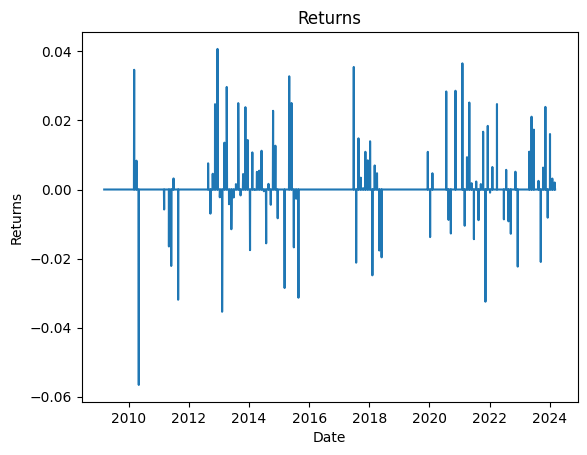

In [ ]:
plt.plot(returns_df['Returns'])
plt.title('Returns')
plt.xlabel('Date')
plt.ylabel('Returns')

plt.show()

In [ ]:
risk_p = np.array(RISK)
risk_df = pd.DataFrame(risk_p, columns=['Date', 'Risk'])
risk_df.index = risk_df['Date']
risk_df.drop('Date', axis=1, inplace=True)

st_risk_p = np.array(St_RISK)
st_risk_df = pd.DataFrame(st_risk_p, columns=['Date', 'Risk'])
st_risk_df.index = st_risk_df['Date']
st_risk_df.drop('Date', axis=1, inplace=True)


In [ ]:
STDEV = st_risk_df.mean() * np.sqrt(14*252)

In [ ]:
SR = (returns_df['Cumulative Returns'].iloc[-1] - 1) / STDEV

In [ ]:
SR

Risk    0.734357
dtype: float64

In [ ]:
RET_RISK = (returns_df['Cumulative Returns'].iloc[-1] - 1) / risk_df['Risk'].mean()

In [ ]:
RET_RISK

13609.2137505597

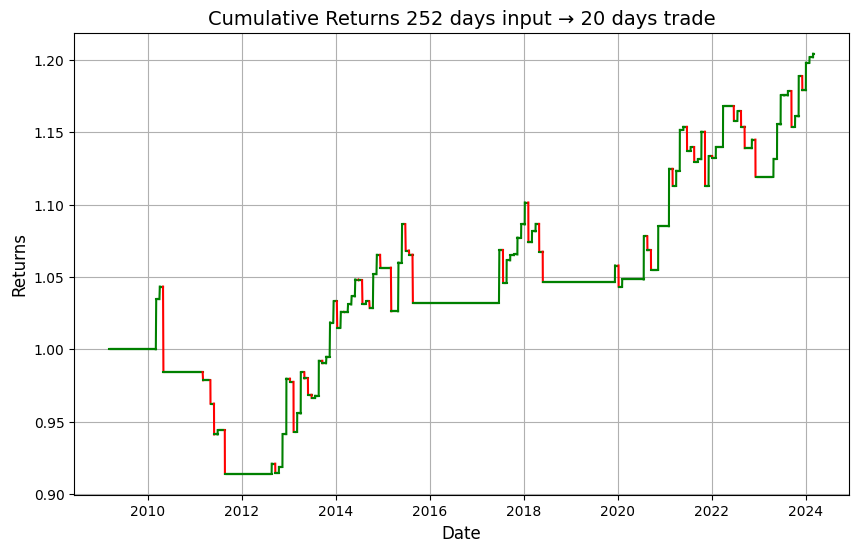

In [ ]:

plt.figure(figsize=(10, 6))

# We need to plot segments in different colors based on the direction of the return
previous_return = returns_df['Cumulative Returns'][0]
for i, current_return in enumerate(returns_df['Cumulative Returns'][1:], start=1):
    if current_return >= previous_return:
        plt.plot(returns_df.index[i-1:i+1], returns_df['Cumulative Returns'][i-1:i+1], 'g-')
    else:
        plt.plot(returns_df.index[i-1:i+1], returns_df['Cumulative Returns'][i-1:i+1], 'r-')
    previous_return = current_return

plt.title('Cumulative Returns 252 days input → 20 days trade', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Returns', fontsize=12)
plt.grid(True)
plt.show()